In [8]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import rcParams
import plotly.graph_objects as go
import plotly.express as px 
from plotly.subplots import make_subplots
from scipy import stats
import statsmodels.api as sm
import warnings
from itertools import product
from datetime import datetime
warnings.filterwarnings('ignore')
from plotly import tools
import plotly.figure_factory as ff
import plotly.graph_objs as go
from chart_studio.plotly import *

import time
import copy
import chainer
import chainer.functions as F
import chainer.links as L
from plotly import tools
from plotly.offline import init_notebook_mode, iplot, iplot_mpl
init_notebook_mode()

from random import randint
import plotly.graph_objects as go
import plotly.figure_factory as ff
from itertools import product
import statsmodels.api as sm
from tqdm import tqdm
from imblearn.over_sampling import SMOTENC
from lightgbm import LGBMClassifier

from sklearn.decomposition import PCA
from sklearn.neural_network import MLPClassifier
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.preprocessing import LabelEncoder,OneHotEncoder
from sklearn.model_selection import StratifiedKFold,KFold
from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestRegressor , AdaBoostClassifier, RandomForestClassifier, BaggingClassifier, GradientBoostingClassifier,VotingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

from sklearn.naive_bayes import GaussianNB
from imblearn.over_sampling import SMOTENC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn.metrics import f1_score
from sklearn.metrics import mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier,XGBRegressor
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.linear_model import LinearRegression,Ridge,Lasso,RidgeClassifier, RidgeClassifierCV
from sklearn.metrics import mean_squared_error
from sklearn.metrics import classification_report,precision_recall_curve
import tensorflow as tf
from tensorflow import keras
from keras.callbacks import TensorBoard
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Input, Conv2D, MaxPool2D,MaxPooling2D, UpSampling2D,Flatten
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from keras.utils import plot_model
from keras.models import load_model, Model
from tensorflow.keras.utils import to_categorical
from keras.models import Sequential
from tensorflow.keras.optimizers.legacy import Adam, SGD
from tensorflow.keras.optimizers import Adam, SGD
from subprocess import check_output
import warnings
warnings.filterwarnings('ignore')


plt.rcParams['figure.figsize'] = (5,3)
plt.rcParams["figure.dpi"] = 120

In [4]:
c = pd.read_csv('C:/Users/Mua/Downloads/Compressed/cardio_train.csv',sep=";")
c

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,99993,19240,2,168,76.0,120,80,1,1,1,0,1,0
69996,99995,22601,1,158,126.0,140,90,2,2,0,0,1,1
69997,99996,19066,2,183,105.0,180,90,3,1,0,1,0,1
69998,99998,22431,1,163,72.0,135,80,1,2,0,0,0,1


In [5]:
c.describe(percentiles=[0.1, 0.25, 0.75, 0.9, 0.95]).T.apply(lambda x: x.apply("{0:.3f}".format))

,count,mean,std,min,10%,25%,50%,75%,90%,95%,max
id,70000.000,49972.420,28851.302,0.000,9983.900,25006.750,50001.500,74889.250,89965.300,94937.150,99999.000
age,70000.000,19468.866,2467.252,10798.000,15840.000,17664.000,19703.000,21327.000,22639.000,23259.000,23713.000
gender,70000.000,1.350,0.477,1.000,1.000,1.000,1.000,2.000,2.000,2.000,2.000
height,70000.000,164.359,8.210,55.000,155.000,159.000,165.000,170.000,175.000,178.000,250.000
weight,70000.000,74.206,14.396,10.000,58.000,65.000,72.000,82.000,93.000,100.000,200.000
ap_hi,70000.000,128.817,154.011,-150.000,110.000,120.000,120.000,140.000,150.000,160.000,16020.000
ap_lo,70000.000,96.630,188.473,-70.000,70.000,80.000,80.000,90.000,90.000,100.000,11000.000
cholesterol,70000.000,1.367,0.680,1.000,1.000,1.000,1.000,2.000,3.000,3.000,3.000
gluc,70000.000,1.226,0.572,1.000,1.000,1.000,1.000,1.000,2.000,3.000,3.000
smoke,70000.000,0.088,0.283,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000


In [6]:
def check(c):
    l=[]
    columns=c.columns
    for col in columns:
        dtypes=c[col].dtypes
        nunique=c[col].nunique()
        sum_null=c[col].isnull().sum()
        l.append([col,dtypes,nunique,sum_null])
    c_check=pd.DataFrame(l)
    c_check.columns=['column','dtypes','nunique','sum_null']
    return c_check
check(c)

,column,dtypes,nunique,sum_null
0,id,int64,70000,0
1,age,int64,8076,0
2,gender,int64,2,0
3,height,int64,109,0
4,weight,float64,287,0
5,ap_hi,int64,153,0
6,ap_lo,int64,157,0
7,cholesterol,int64,3,0
8,gluc,int64,3,0
9,smoke,int64,2,0


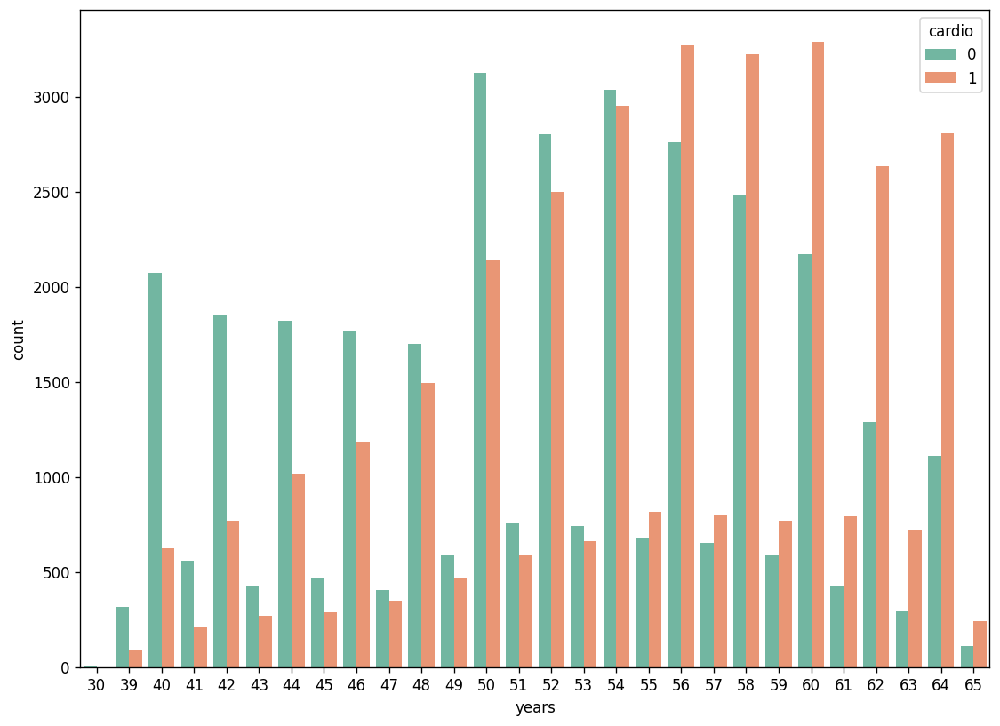

In [10]:
rcParams['figure.figsize'] = 11, 8
c['years'] = (c['age'] / 365).round().astype('int')
sns.countplot(x='years', hue='cardio', data = c, palette="Set2");

In [ ]:
fig = go.Figure()

fig.add_trace(go.Box(x=c['height'], name = 'Height', boxpoints='outliers',))
fig.add_trace(go.Box(x=c['weight'], name = 'Weight', boxpoints='outliers',))

fig.update_layout(title_text="Box Plot for Weight and Height with Outliers")
fig.show()

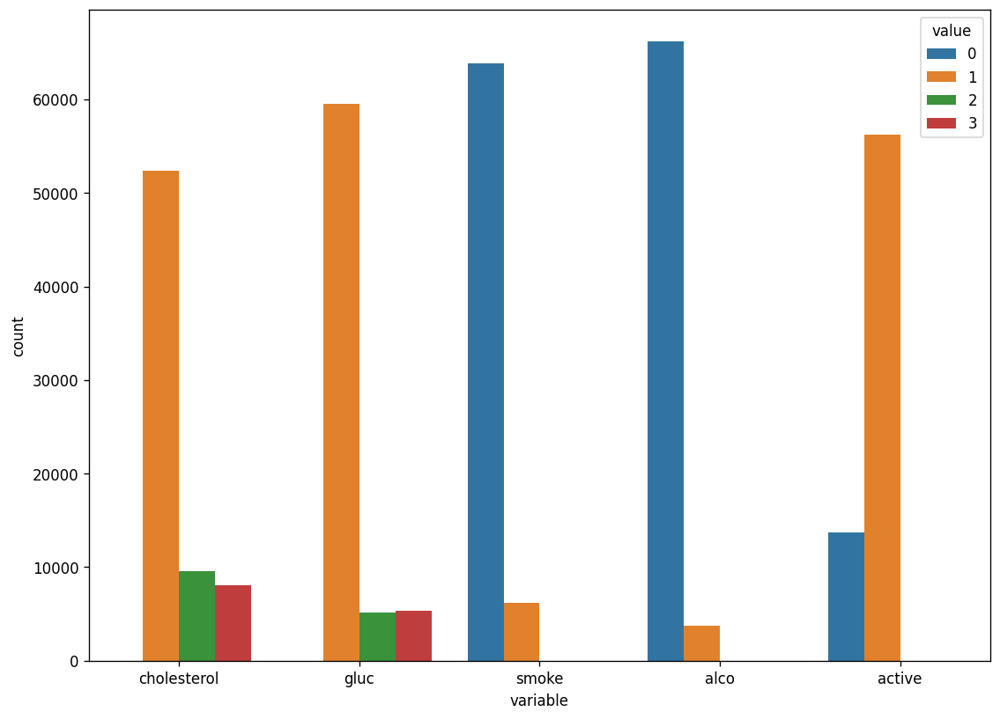

In [12]:
c_categorical = c.loc[:,['cholesterol','gluc', 'smoke', 'alco', 'active']]
sns.countplot(x="variable", hue="value",data= pd.melt(c_categorical));

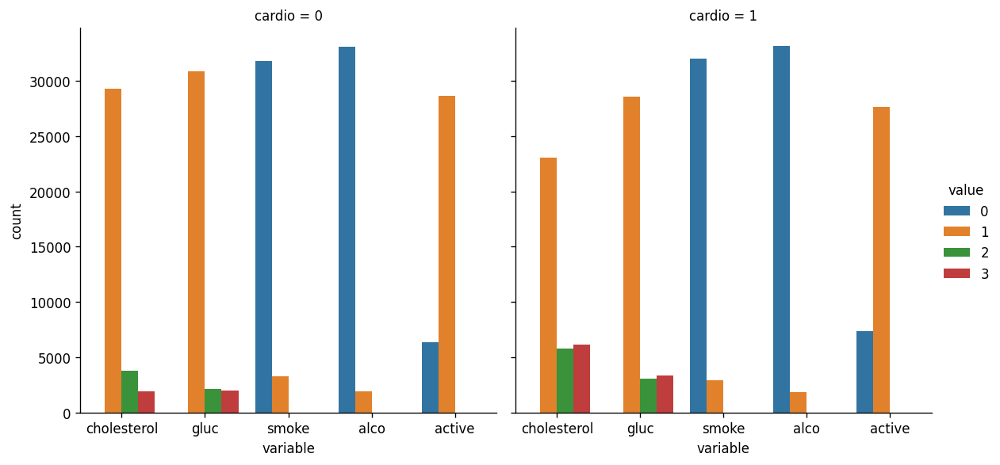

In [13]:
c_long = pd.melt(c, id_vars=['cardio'], value_vars=['cholesterol','gluc', 'smoke', 'alco', 'active'])
sns.catplot(x="variable", hue="value", col="cardio",
                data=c_long, kind="count");

Diastilic pressure is higher than systolic one in 0 cases


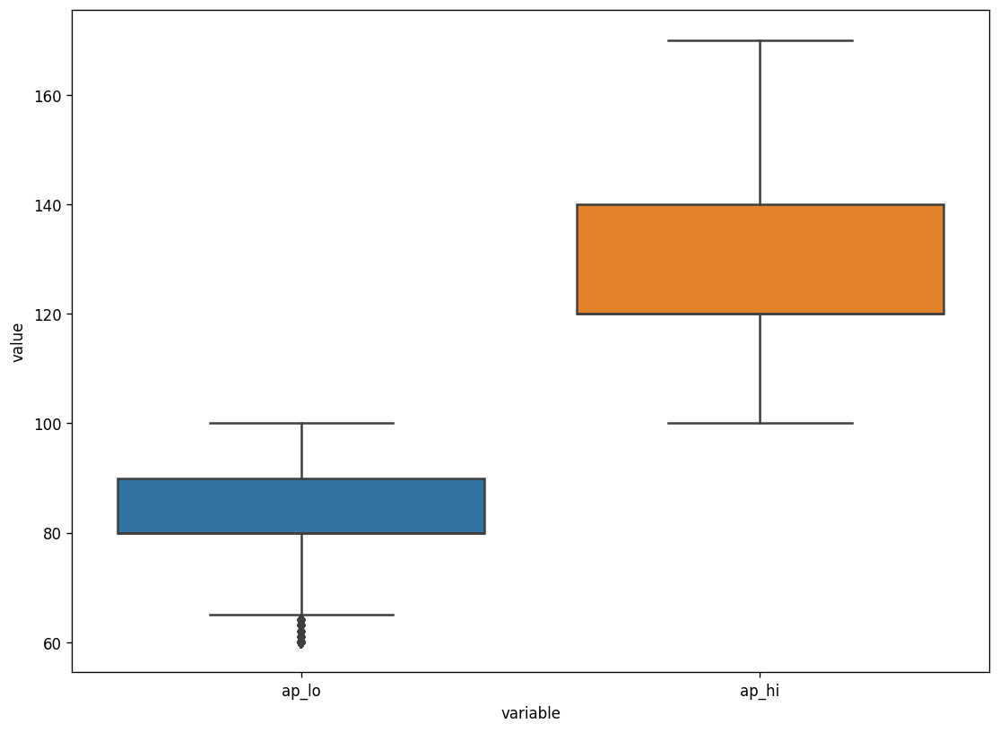

In [15]:
c.drop(c[(c['ap_hi'] > c['ap_hi'].quantile(0.975)) | (c['ap_hi'] < c['ap_hi'].quantile(0.025))].index,inplace=True)
c.drop(c[(c['ap_lo'] > c['ap_lo'].quantile(0.975)) | (c['ap_lo'] < c['ap_lo'].quantile(0.025))].index,inplace=True)

blood_pressure = c.loc[:,['ap_lo','ap_hi']]
sns.boxplot(x = 'variable',y = 'value',data = blood_pressure.melt())
print("Diastilic pressure is higher than systolic one in {0} cases".format(c[c['ap_lo']> c['ap_hi']].shape[0]))

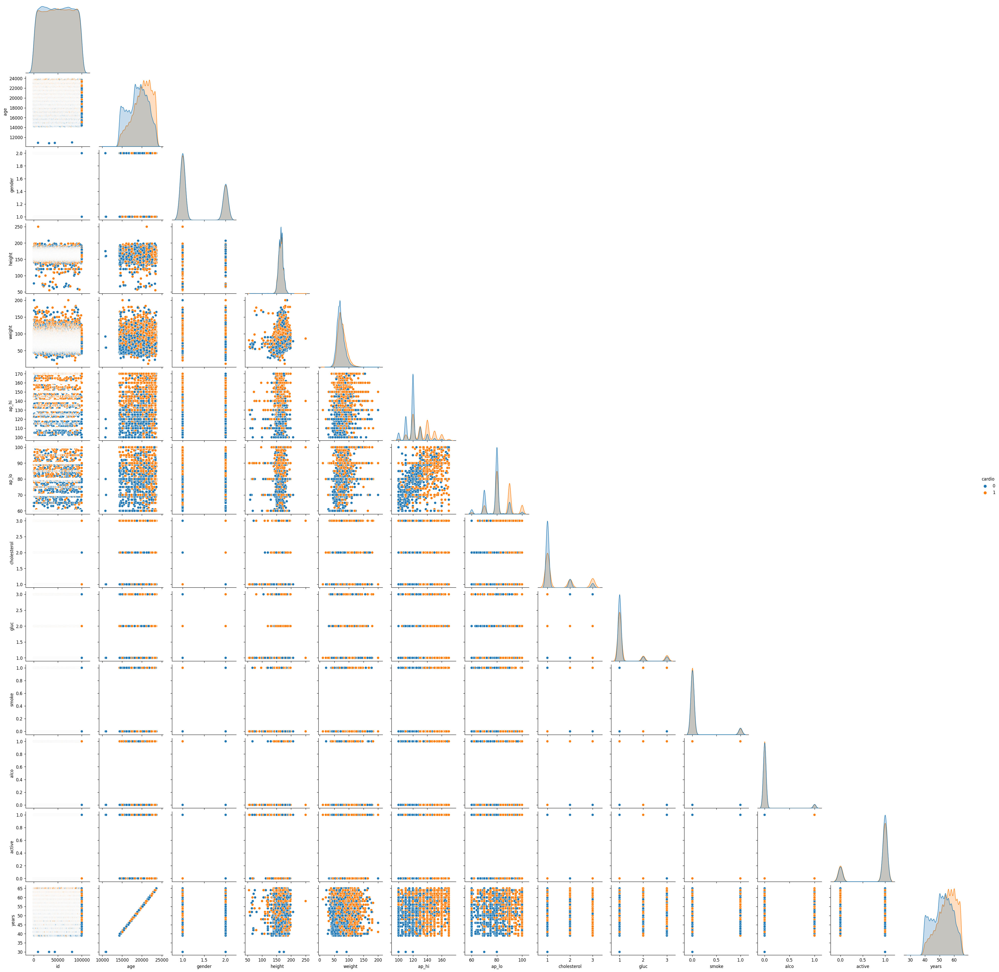

In [18]:
sns.pairplot(c,hue='cardio',corner=True)

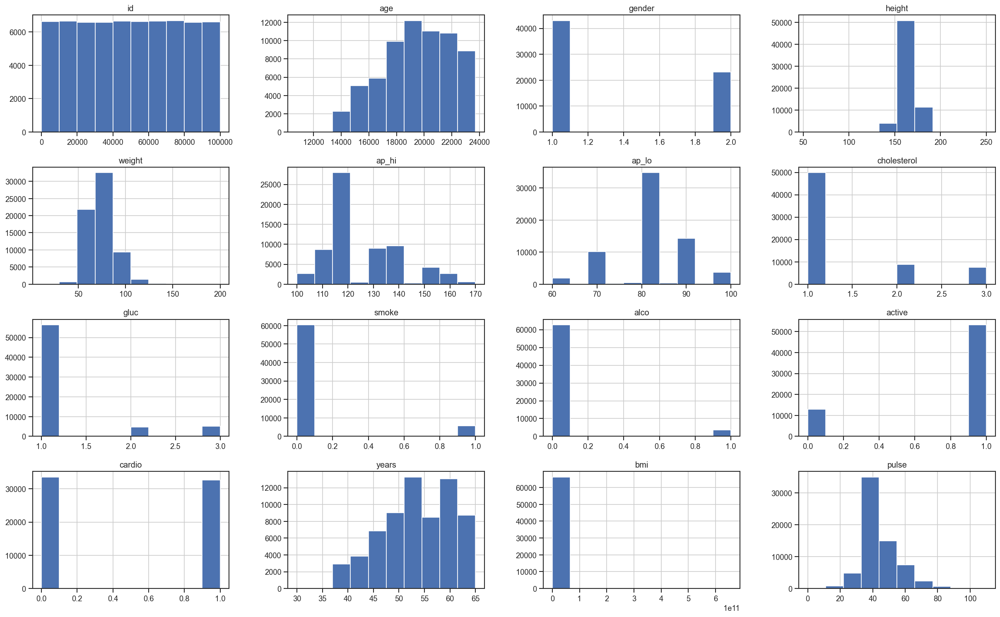

In [41]:
c.hist(figsize=(25,15))
plt.show()

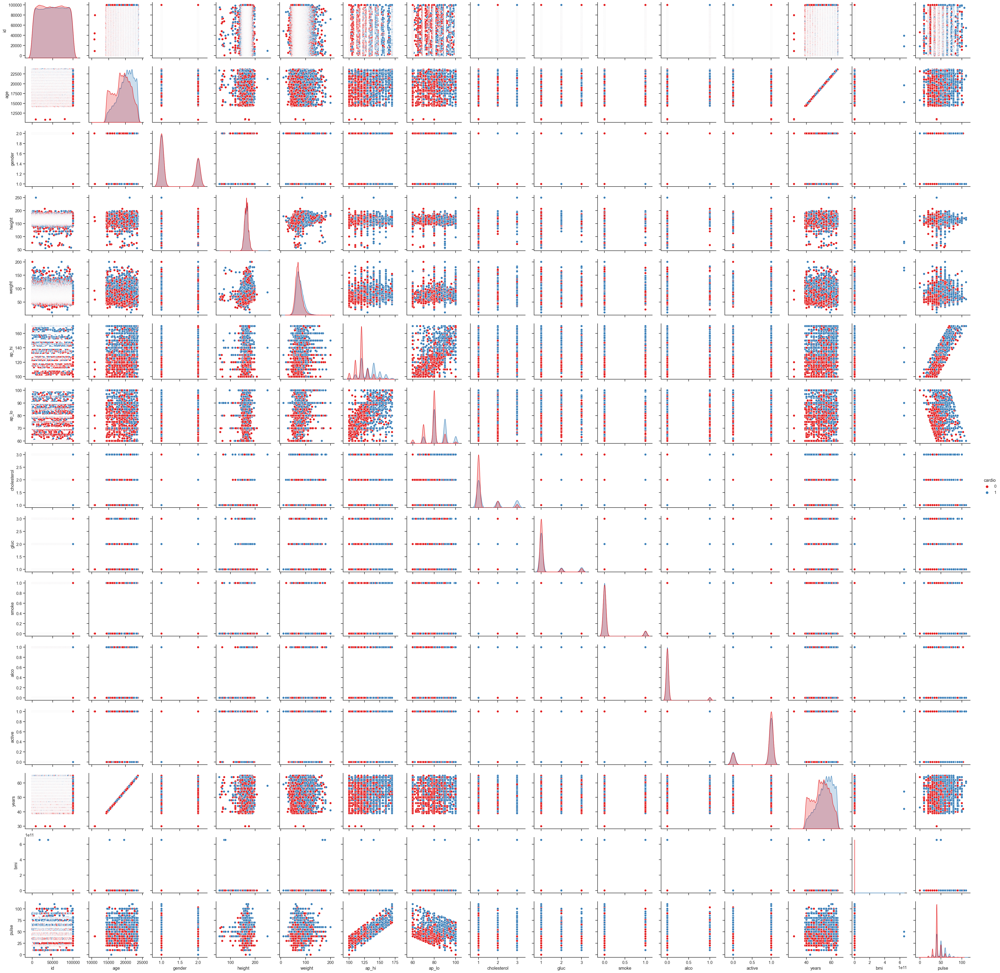

In [40]:
sns.set(style="ticks")
sns.pairplot(c, hue="cardio", palette="Set1")
plt.show()

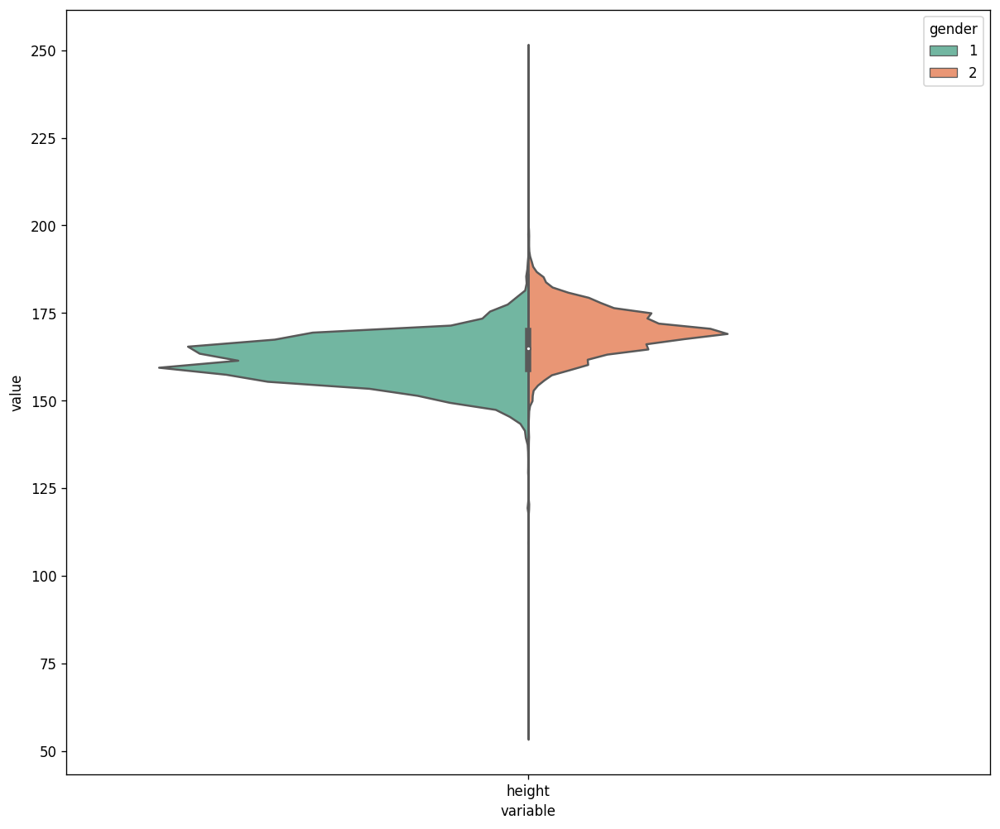

In [20]:
c_melt = pd.melt(frame=c, value_vars=['height'], id_vars=['gender'])
plt.figure(figsize=(12, 10))
ax = sns.violinplot(
    x='variable', 
    y='value', 
    hue='gender', 
    split=True, 
    data=c_melt, 
    scale='count',
    scale_hue=False,
    palette="Set2");

In [26]:
fig = make_subplots(rows=2, cols=3,subplot_titles=("Alchoal Distribution", "Gender Distribution", "Choslesterol Distribution", "Glucose Distribution", "Smoking Distribution", "Fitness Distribution"), specs=[[{'type':'domain'}, {'type':'domain'}, {'type':'domain'}], [{'type':'domain'}, {'type':'domain'}, {'type':'domain'}]])

fig.add_trace(go.Pie(labels=['Non Alchoalic', 'Alchoalic'],values=c['alco'].value_counts().values, name = 'Alchoal Status'), 1, 1)
fig.add_trace(go.Pie(labels=['Female', 'Male'],values=c['gender'].value_counts().values, name = 'Gender Status'), 1, 2)

fig.add_trace(go.Pie(labels=['Normal', 'Above Normal', 'Well Above Normal'],values=c['cholesterol'].value_counts().values, name = 'Cholesterol Level Status'), 1, 3)
fig.add_trace(go.Pie(labels=['Normal', 'Above Normal', 'Well Above Normal'],values=c['gluc'].value_counts().values, name = 'Glucose Level Status'), 2, 1)

fig.add_trace(go.Pie(labels=['Non Smoker', 'Smoker'],values=c['smoke'].value_counts().values, name = 'Smoking Status'), 2, 2)
fig.add_trace(go.Pie(labels=['Not Involved in Physical Activites', 'Involved in Physical Activites'],values=c['active'].value_counts().values, name = 'Fitness Status'), 2, 3)

fig.update_traces(hole=.4,)
fig.update_layout(title_text="Distribution of Various Categorial Values")

fig.show()

In [28]:
def BMI(c):
    return np.exp(c['weight']) / (np.exp(c['height'])/100)**2 
 
c['bmi'] = c.apply(BMI, axis=1)

In [30]:
def pulse(c):
    return np.subtract(c['ap_hi'], c['ap_lo'])
 
c['pulse'] = c.apply(pulse, axis=1)

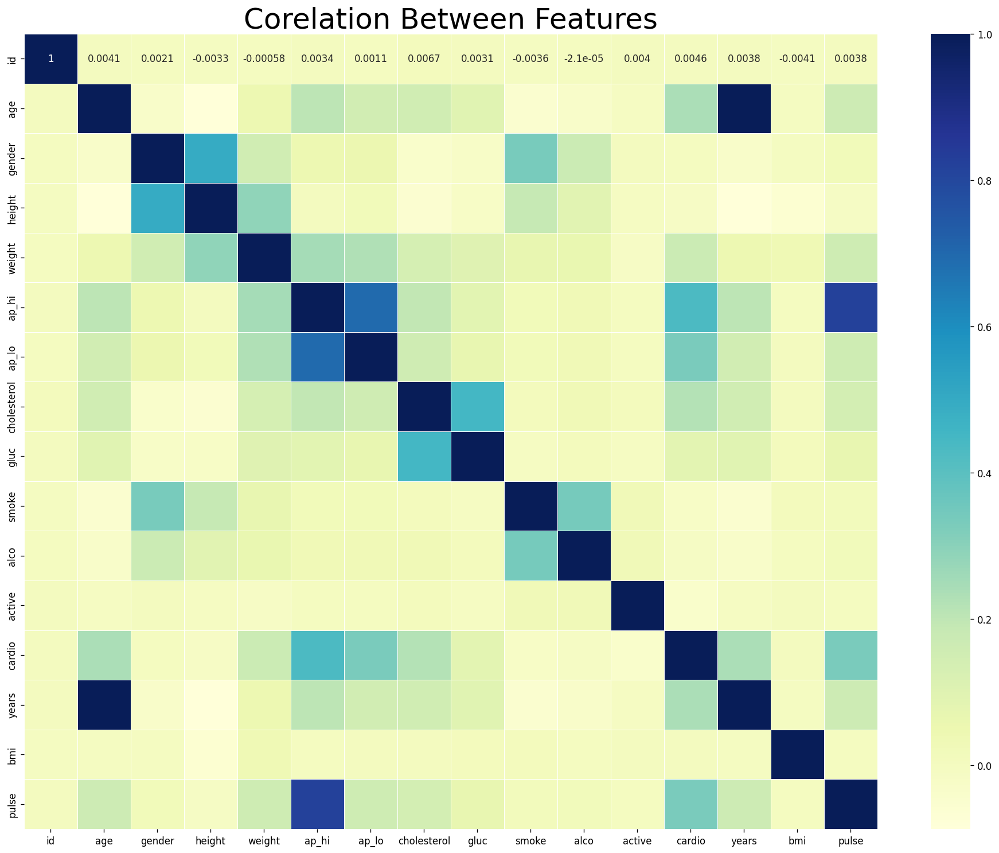

In [31]:
plt.rcParams['figure.figsize'] = (20, 15) 
sns.heatmap(c.corr(), annot = True, linewidths=.5, cmap="YlGnBu")
plt.title('Corelation Between Features', fontsize = 30)
plt.show()

In [35]:
x = c.drop(['cardio', 'bmi', 'weight', 'gluc', 'gender', 'smoke', 'alco', 'active'], axis =1)
y = c['cardio']

In [37]:
scaler = StandardScaler()
standardx = scaler.fit_transform(x)

In [38]:
xtrain, xtest, ytrain, ytest = train_test_split(standardx, y, test_size=0.2, random_state=42, shuffle = True)

In [42]:
data = c['cardio']
length = int(len(c['cardio']) * 0.90)
print('Length:', length)
print('Data length:',len(data))
train = data.iloc[:length]
print('training shape',train.shape)
test = data.iloc[length:]
print('testing shape',test.shape)

Length: 59573
Data length: 66193
training shape (59573,)
testing shape (6620,)


In [43]:
KF = KFold(n_splits=3,shuffle=True)
for train_index, test_index in KF.split(x):
    xtrain, xtest = x.iloc[list(train_index)], x.iloc[list(test_index)]
    ytrain, ytest = y.iloc[list(train_index)], y.iloc[list(test_index)]
    
print("Train data shape:{}".format(xtrain.shape))
print("Test data shape:{}".format(xtest.shape))

Train data shape:(44129, 8)
Test data shape:(22064, 8)


Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=126874.294, Time=2.83 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=110071.815, Time=1.23 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=116867.322, Time=6.12 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=103357.067, Time=1.19 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=99589.400, Time=1.52 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=inf, Time=33.55 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=26.05 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=86469.346, Time=6.66 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=86467.405, Time=8.72 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=86465.459, Time=3.45 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=86465.869, Time=5.40 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=86467.459, Time=16.10 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=86465.455, Time=6.21 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=86467.404, Time=8.08 sec
 ARIMA(1,0,2)(0,0,0)[0] 

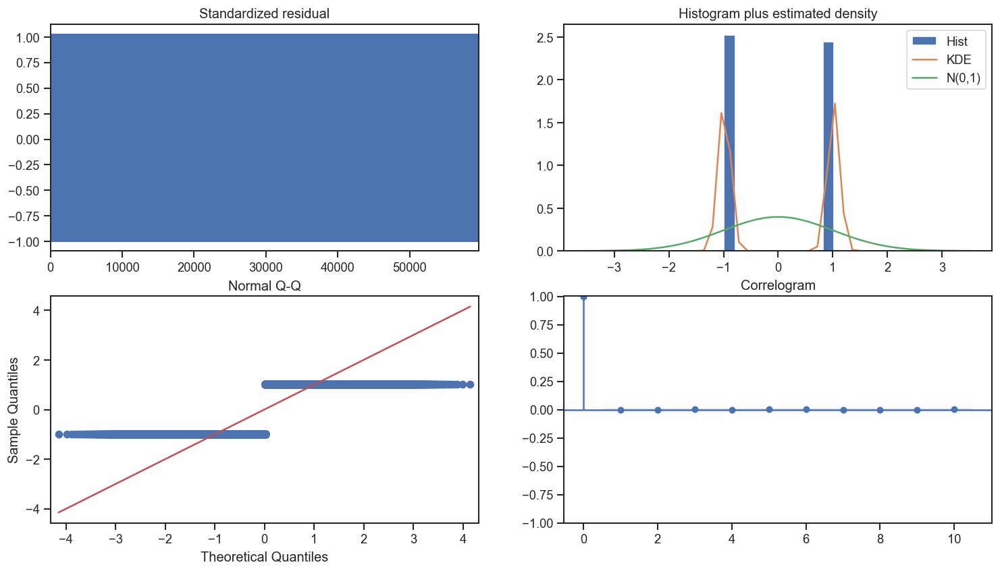

In [44]:
from pmdarima.arima import auto_arima

model_autoARIMA = auto_arima(train, start_p=0, start_q=0,
                      test='adf',
                      max_p=3, max_q=3,
                      m=1,
                      d=None,
                      seasonal=False,
                      start_P=0,
                      D=0,
                      trace=True,
                      error_action='ignore',
                      suppress_warnings=True,
                      stepwise=True)
print(model_autoARIMA.summary())
model_autoARIMA.plot_diagnostics(figsize=(15,8))
plt.show()

In [47]:
dict_classifiers = {
    "Logistic Regression": LogisticRegression(),
    "Nearest Neighbors": KNeighborsClassifier(),
    "Linear SVM": SVC(),
    "Gradient Boosting Classifier": GradientBoostingClassifier(),
    "Decision Tree": tree.DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(n_estimators=18),
    "Neural Net": MLPClassifier(alpha=1),
    "Naive Bayes": GaussianNB()
}

no_classifiers = len(dict_classifiers.keys())

def batch_classify(xtrain, ytrain, verbose = True):
    c_results = pd.DataFrame(data=np.zeros(shape=(no_classifiers,3)), columns = ['classifier', 'train_score', 'training_time'])
    count = 0
    for key, classifier in dict_classifiers.items():
        t_start = time.process_time()
        classifier.fit(xtrain, ytrain)
        t_end = time.process_time()
        t_diff = t_end - t_start
        train_score = classifier.score(xtrain, ytrain)
        c_results.loc[count,'classifier'] = key
        c_results.loc[count,'train_score'] = train_score
        c_results.loc[count,'training_time'] = t_diff
        if verbose:
            print("trained {c} in {f:.2f} s".format(c=key, f=t_diff))
        count+=1
    return c_results
c_results = batch_classify(xtrain, ytrain)
print(c_results.sort_values(by='train_score', ascending=False))

trained Logistic Regression in 0.59 s
trained Nearest Neighbors in 0.16 s
trained Linear SVM in 165.06 s
trained Gradient Boosting Classifier in 8.72 s
trained Decision Tree in 0.62 s
trained Random Forest in 2.36 s
trained Neural Net in 7.36 s
trained Naive Bayes in 0.02 s
                     classifier  train_score  training_time
4                 Decision Tree     1.000000       0.625000
5                 Random Forest     0.992295       2.359375
3  Gradient Boosting Classifier     0.730291       8.718750
1             Nearest Neighbors     0.712797       0.156250
7                   Naive Bayes     0.708083       0.015625
0           Logistic Regression     0.701013       0.593750
6                    Neural Net     0.603367       7.359375
2                    Linear SVM     0.594847     165.062500


In [48]:
# Logistic Regression
log_reg = LogisticRegression()
log_scores = cross_val_score(log_reg, xtrain, ytrain, cv=3)
log_reg_mean = log_scores.mean()

# SVC
svc_clf = SVC()
svc_scores = cross_val_score(svc_clf, xtrain, ytrain, cv=3)
svc_mean = svc_scores.mean()

# KNearestNeighbors
knn_clf = KNeighborsClassifier()
knn_scores = cross_val_score(knn_clf, xtrain, ytrain, cv=3)
knn_mean = knn_scores.mean()

# Decision Tree
tree_clf = tree.DecisionTreeClassifier()
tree_scores = cross_val_score(tree_clf, xtrain, ytrain, cv=3)
tree_mean = tree_scores.mean()

# Gradient Boosting Classifier
grad_clf = GradientBoostingClassifier()
grad_scores = cross_val_score(grad_clf, xtrain, ytrain, cv=3)
grad_mean = grad_scores.mean()

# Random Forest Classifier
rand_clf = RandomForestClassifier(n_estimators=18)
rand_scores = cross_val_score(rand_clf, xtrain, ytrain, cv=3)
rand_mean = rand_scores.mean()

# NeuralNet Classifier
neural_clf = MLPClassifier(alpha=1)
neural_scores = cross_val_score(neural_clf, xtrain, ytrain, cv=3)
neural_mean = neural_scores.mean()

# Naives Bayes
nav_clf = GaussianNB()
nav_scores = cross_val_score(nav_clf, xtrain, ytrain, cv=3)
nav_mean = neural_scores.mean()

# Create a Dataframe with the results.
d = {'Classifiers': ['Logistic Reg.', 'SVC', 'KNN', 'Dec Tree', 'Grad B CLF', 'Rand FC', 'Neural Classifier', 'Naives Bayes'], 
    'Crossval Mean Scores': [log_reg_mean, svc_mean, knn_mean, tree_mean, grad_mean, rand_mean, neural_mean, nav_mean]}

result_c = pd.DataFrame(data=d)

result_c = result_c.sort_values(by=['Crossval Mean Scores'], ascending=False)
result_c

,Classifiers,Crossval Mean Scores
0,Logistic Reg.,0.694215
5,Rand FC,0.599083
4,Grad B CLF,0.575991
1,SVC,0.574179
3,Dec Tree,0.566860
6,Neural Classifier,0.557390
7,Naives Bayes,0.557390
2,KNN,0.498742


In [50]:
ytrain_pred = cross_val_predict(grad_clf, xtrain, ytrain, cv=3)

grad_clf.fit(xtrain, ytrain)
print ("Gradient Boost Classifier accuracy is %2.2f" % accuracy_score(ytrain, ytrain_pred))

Gradient Boost Classifier accuracy is 0.58


In [51]:
print('Precision Score: ', precision_score(ytrain, ytrain_pred))

print('Recall Score: ', recall_score(ytrain, ytrain_pred))

print('f1_score: ', f1_score(ytrain, ytrain_pred))

Precision Score:  0.5696578617520078
Recall Score:  0.5651713338246132
f1_score:  0.5674057290823757


In [57]:
voting_clf = VotingClassifier(
    estimators=[('gbc', grad_clf), ('nav', nav_clf), ('neural', neural_clf)],
    voting='soft'
)

voting_clf.fit(xtrain, ytrain)

VotingClassifier(estimators=[('gbc', GradientBoostingClassifier()),
                             ('nav', GaussianNB()),
                             ('neural', MLPClassifier(alpha=1))],
                 voting='soft')

In [55]:
voting_clf = VotingClassifier(
    estimators=[('gbc', grad_clf), ('nav', nav_clf), ('neural', neural_clf)],
    voting='soft'
)

voting_clf.fit(xtrain, ytrain)

for clf in (grad_clf, nav_clf, neural_clf, voting_clf):
    clf.fit(xtrain, ytrain)
    predict = clf.predict(xtest)
    print(clf.__class__.__name__, accuracy_score(ytest, predict))

GradientBoostingClassifier 0.7253569000679809
GaussianNB 0.7051136792809125
MLPClassifier 0.6278419820228114
VotingClassifier 0.6886471787899389


In [58]:
scaler = MinMaxScaler()
scaled_train = scaler.fit_transform(xtrain)
scaled_test = scaler.transform(xtest)

In [59]:
dt = DecisionTreeClassifier()
dt.fit(scaled_train,ytrain)

pred = dt.predict(scaled_test)
accuracy_score(ytest,pred)

0.6266334315280611

In [60]:
param_grid = {'criterion': ['gini', 'entropy'],  #scoring methodology; two supported formulas for calculating information gain - default is gini
              'splitter': ['best', 'random'], #splitting methodology; two supported strategies - default is best
              'max_depth': [2,4,6,8,10,None], #max depth tree can grow; default is none
              'min_samples_split': [2,5,10,.03,.05], #minimum subset size BEFORE new split (fraction is % of total); default is 2
              'min_samples_leaf': [1,5,10,.03,.05], #minimum subset size AFTER new split split (fraction is % of total); default is 1
              'max_features': [None, 'auto'], #max features to consider when performing split; default none or all
              'random_state': [0] #seed or control random number generator
             }
tune_model = GridSearchCV(DecisionTreeClassifier(), 
                          param_grid=param_grid, 
                          scoring = 'roc_auc',
                          cv = 5,
                          verbose=0)
tune_model.fit(scaled_train, ytrain)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 4, 6, 8, 10, None],
                         'max_features': [None, 'auto'],
                         'min_samples_leaf': [1, 5, 10, 0.03, 0.05],
                         'min_samples_split': [2, 5, 10, 0.03, 0.05],
                         'random_state': [0], 'splitter': ['best', 'random']},
             scoring='roc_auc')

In [61]:
print('\033[1m'+'Decision Tree Parameters:{} '.format(tune_model.best_params_))

Decision Tree Parameters:{'criterion': 'entropy', 'max_depth': 8, 'max_features': None, 'min_samples_leaf': 10, 'min_samples_split': 0.03, 'random_state': 0, 'splitter': 'best'} 


In [62]:
dt_tuned =  DecisionTreeClassifier(criterion='gini',
                                   min_samples_split=0.03,
                                   max_depth=None,
                                    max_features = None,
                                   min_samples_leaf=10,
                                   random_state = 0,
                                   splitter='random')

dt_tuned.fit(scaled_train,ytrain)


pred = dt_tuned.predict(scaled_test)
accuracy_score(ytest,pred)

0.7196918196238387

In [64]:
print(classification_report(ytest,pred))

              precision    recall  f1-score   support

           0       0.70      0.77      0.74      6714
           1       0.74      0.66      0.70      6525

    accuracy                           0.72     13239
   macro avg       0.72      0.72      0.72     13239
weighted avg       0.72      0.72      0.72     13239



In [73]:
import math
data = c.filter(['cardio'])
dataset = c.values #convert the data frame to a numpy array
training_data_len = math.ceil(len(dataset)*.8)  # number of rows to train the model on
training_data_len

52955

In [75]:
scaler = MinMaxScaler(feature_range=(0,1))
scaled_data = scaler.fit_transform(c)
scaled_data

array([[0.00000000e+000, 5.88075881e-001, 1.00000000e+000, ...,
        5.71428571e-001, 1.53465686e-127, 2.72727273e-001],
       [1.00001000e-005, 7.30158730e-001, 0.00000000e+000, ...,
        7.14285714e-001, 3.96142952e-107, 4.54545455e-001],
       [2.00002000e-005, 6.24003097e-001, 0.00000000e+000, ...,
        6.28571429e-001, 4.57474762e-124, 5.45454545e-001],
       ...,
       [9.99960000e-001, 9.13898568e-001, 0.00000000e+000, ...,
        9.14285714e-001, 4.64245566e-091, 4.54545455e-001],
       [9.99990000e-001, 9.00735579e-001, 0.00000000e+000, ...,
        8.85714286e-001, 7.44562094e-119, 5.00000000e-001],
       [1.00000000e+000, 7.54316686e-001, 0.00000000e+000, ...,
        7.42857143e-001, 6.19124764e-125, 3.63636364e-001]])

In [76]:
train_data = scaled_data[0:int(training_data_len), :]
# Split the data into x_train and y_train data sets
xtrain = []
ytrain = []

for i in range(60, len(train_data)):
    xtrain.append(train_data[i-60:i, 0])
    ytrain.append(train_data[i, 0])
    if i<= 61:
        print(xtrain)
        print(ytrain)
        print()

# Convert the x_train and y_train to numpy arrays
xtrain, ytrain = np.array(xtrain), np.array(ytrain)

# Reshape the data
xtrain = np.reshape(xtrain, (xtrain.shape[0], xtrain.shape[1], 1))

[array([0.000000e+00, 1.000010e-05, 2.000020e-05, 3.000030e-05,
       4.000040e-05, 8.000080e-05, 9.000090e-05, 1.200012e-04,
       1.300013e-04, 1.400014e-04, 1.500015e-04, 1.600016e-04,
       1.800018e-04, 2.100021e-04, 2.300023e-04, 2.400024e-04,
       2.500025e-04, 2.700027e-04, 2.800028e-04, 2.900029e-04,
       3.000030e-04, 3.100031e-04, 3.200032e-04, 3.300033e-04,
       3.500035e-04, 3.600036e-04, 3.700037e-04, 3.800038e-04,
       3.900039e-04, 4.000040e-04, 4.200042e-04, 4.300043e-04,
       4.400044e-04, 4.500045e-04, 4.600046e-04, 4.700047e-04,
       4.900049e-04, 5.100051e-04, 5.200052e-04, 5.300053e-04,
       5.400054e-04, 5.600056e-04, 5.700057e-04, 5.800058e-04,
       5.900059e-04, 6.000060e-04, 6.100061e-04, 6.200062e-04,
       6.300063e-04, 6.400064e-04, 6.500065e-04, 6.600066e-04,
       6.700067e-04, 6.800068e-04, 6.900069e-04, 7.000070e-04,
       7.200072e-04, 7.300073e-04, 7.700077e-04, 8.100081e-04])]
[0.0008300083000830008]

[array([0.000000e+00, 1.000

In [77]:
model = Sequential()

model.add(LSTM(units=96, return_sequences=True, input_shape=(xtrain.shape[1], 1)))
model.add(Dropout(0.2))
model.add(LSTM(units=96,return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(units=96,return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(units=96))
model.add(Dropout(0.2))
model.add(Dense(units=1))

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 60, 96)              │          37,632 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 60, 96)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 60, 96)              │          74,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 60, 96)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 60, 96)              │          74,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 60, 96)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 96)                  │          74,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 96)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1)                   │              97 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 260,065 (1015.88 KB)

 Trainable params: 260,065 (1015.88 KB)

 Non-trainable params: 0 (0.00 B)

In [79]:
model.compile(loss='binary_crossentropy',optimizer='Adam')

# Train the model
model.fit(xtrain, ytrain, batch_size=32, epochs=10)

Epoch 1/10
1653/1653 ━━━━━━━━━━━━━━━━━━━━ 336s 195ms/step - loss: 0.5830
Epoch 2/10
1653/1653 ━━━━━━━━━━━━━━━━━━━━ 317s 191ms/step - loss: 0.5530
Epoch 3/10
1653/1653 ━━━━━━━━━━━━━━━━━━━━ 316s 188ms/step - loss: 0.5508
Epoch 4/10
1653/1653 ━━━━━━━━━━━━━━━━━━━━ 309s 187ms/step - loss: 0.5517
Epoch 5/10
1653/1653 ━━━━━━━━━━━━━━━━━━━━ 313s 189ms/step - loss: 0.5562
Epoch 6/10
1653/1653 ━━━━━━━━━━━━━━━━━━━━ 315s 190ms/step - loss: 0.5529
Epoch 7/10
1653/1653 ━━━━━━━━━━━━━━━━━━━━ 309s 187ms/step - loss: 0.5518
Epoch 8/10
1653/1653 ━━━━━━━━━━━━━━━━━━━━ 310s 187ms/step - loss: 0.5519
Epoch 9/10
1653/1653 ━━━━━━━━━━━━━━━━━━━━ 307s 186ms/step - loss: 0.5513
Epoch 10/10
1653/1653 ━━━━━━━━━━━━━━━━━━━━ 310s 187ms/step - loss: 0.5513


In [97]:
val

,cardio
55992,0
55993,1
55995,1
55996,1
55997,0
...,...
69994,1
69995,0
69996,1
69998,1


In [100]:
model.save('CDV.keras')
print('Model Saved Successfully')

Model Saved Successfully


In [106]:
model = load_model('CDV.keras')
print('Model Loaded Successfully')

Model Loaded Successfully
